In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import seaborn as sns
import plotly.express as px
from sklearn.metrics import mean_absolute_error

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, RandomizedSearchCV, cross_val_predict, cross_validate, GridSearchCV, train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler

import warnings
warnings.filterwarnings('ignore')

import shap
shap.initjs()


df_normal_quality = pd.read_csv('dataframes/df_normal_quality.csv', index_col= 0).reset_index(drop = True)
y = df_normal_quality.SalePrice
X = df_normal_quality.drop(['SalePrice', 'PID'], axis =1).copy()

kf = KFold(n_splits=5, shuffle=True, random_state=42)
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)
numerical_columns = numerical_columns_selector(X)
categorical_columns = categorical_columns_selector(X)


# LASSO

In [28]:
categorical_preprocessor = OneHotEncoder(handle_unknown="ignore")               

numerical_preprocessor = RobustScaler()


preprocessor = ColumnTransformer(
    [
        ("robust_scaler", numerical_preprocessor, numerical_columns),
        ("one-hot-encoder", categorical_preprocessor, categorical_columns),
    ]
)



lasso_pipe = Pipeline(steps=[("Preprocess", preprocessor), 
                             ("Regressor", TransformedTargetRegressor(regressor = Lasso(alpha = 0.0003059499593517016),
                                                                func =np.log, inverse_func=np.exp))])

                         
scores = cross_val_score(lasso_pipe, X, y, cv = kf, error_score='raise')

print('Lasso')

lasso_std = scores.std()
lasso_score = scores.mean()

print('score', lasso_score)
print('standard deviation', lasso_std)
print('      ')

lasso_pipe.fit(X,y)

lasso_predictions = lasso_pipe.predict(X)
print('predicted prices', lasso_predictions)

lasso_mae = mean_absolute_error(y, lasso_predictions)
print('Mean Absolute Error:', lasso_mae)

lasso_mpv = lasso_predictions.mean()
print ('Mean Predicted Home Value', lasso_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)
print('      ')

Lasso
score 0.9508125679921836
standard deviation 0.004995965282436691
      
predicted prices [125415.46689604 130117.07504741 115860.94910926 ... 153060.14400882
 224551.71100964 223786.68230574]
Mean Absolute Error: 10279.818581988946
Mean Predicted Home Value 172915.24056661013
Mean  Home Value 173427.01285897984
      


# SHAP

In [29]:
lasso_pipe.fit(X,y)

explainer_lasso_log = shap.LinearExplainer(lasso_pipe.named_steps['Regressor'].regressor_,
                          masker = lasso_pipe.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_lass_log = explainer_lasso_log(lasso_pipe.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = lasso_pipe.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_lasso_log = pd.DataFrame(shap_values_lass_log.values, columns=transformed_feature_names)

categorical_prefixes = categorical_columns_selector(X)
categorical_prefixes = ["one-hot-encoder__" + word for word in categorical_prefixes]
categorical_prefixes

for prefix in categorical_prefixes:
    # Get columns that start with the prefix
    columns = [col for col in transformed_feature_names if col.startswith(prefix)]
    
    # Calculate mean SHAP value for these columns
    shap_values_df_lasso_log[prefix] = shap_values_df_lasso_log[columns].sum(axis=1)
    
    # Drop the individual encoded columns
    shap_values_df_lasso_log.drop(columns=columns, inplace=True)

# Get rid of prefixes
shap_values_df_lasso_log.columns = shap_values_df_lasso_log.columns.str.replace('robust_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_lasso_log.columns = shap_values_df_lasso_log.columns.str.replace('one-hot-encoder__', 
                                                                    '', 
                                                                    regex=False)

# reorder X columns so the original values are in the same order as the shap df
X_new_order = list(numerical_columns) + list(categorical_columns)
X_new_order =X[X_new_order]

observations = range(shap_values_df_lasso_log.shape[0])
dollar_shap_df_lasso = pd.DataFrame(columns=X_new_order.columns)
order = X_new_order.columns

for observation in observations:
    shap_values = shap_values_df_lasso_log.iloc[observation].reindex(shap_values_df_lasso_log.iloc[observation].abs().sort_values().index)
    features = shap_values.index.tolist()
    values = shap_values.values.tolist()
    bv = shap_values_lass_log.base_values[1]
    SHAPs = values
    changes = []
    
    for shaps in SHAPs:
        changes.append((np.exp(bv + shaps) - np.exp(bv)))
        bv = bv + shaps 
        
    df_change = pd.DataFrame({'Feature': features, 'Change': changes})
    df_change = df_change.set_index('Feature').T
    df_ordered_changes = df_change[order]
    dollar_shap_df_lasso.loc[observation] = df_ordered_changes.iloc[0]

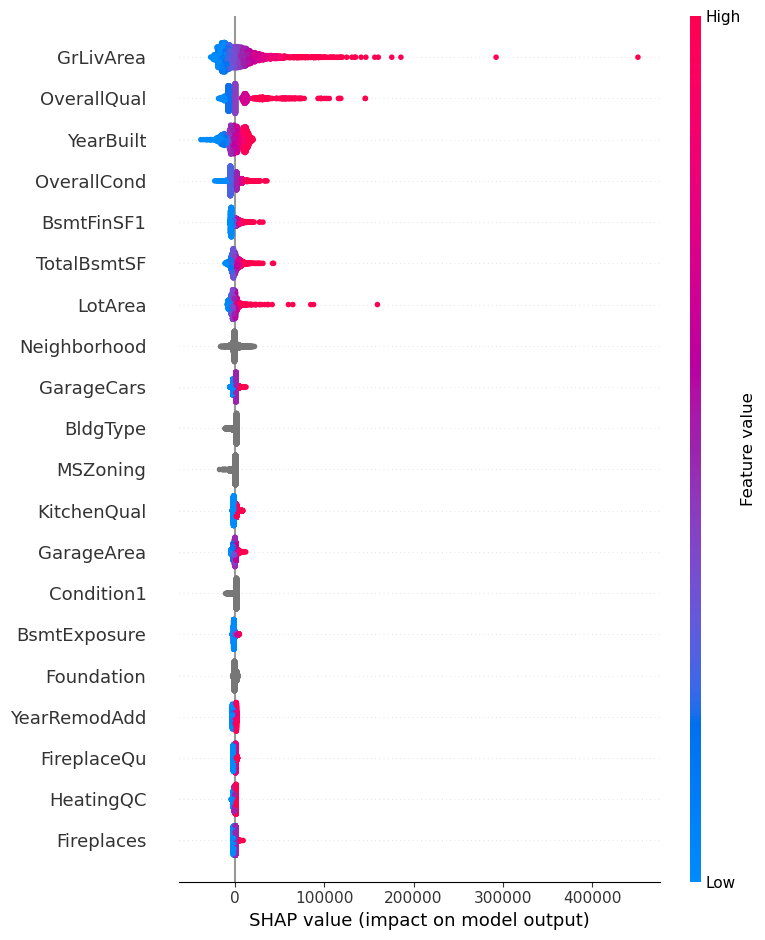

In [30]:
# Create a shap.Explanation with scaled shap values and correct feature names 
exp_lasso = shap.Explanation(dollar_shap_df_lasso.values, 
                       np.exp(shap_values_lass_log.base_values),
                       X_new_order)

shap.summary_plot(exp_lasso)

# XGB

In [410]:
categorical_preprocessor_OHE = OneHotEncoder(handle_unknown="ignore", drop = None)
categorical_preprocessor_O =  OrdinalEncoder(handle_unknown="use_encoded_value", 
                                           unknown_value= -1)
numerical_preprocessor = StandardScaler()

preprocessor_OHE = ColumnTransformer(
    [
        ("standard_scaler", numerical_preprocessor, numerical_columns),
        ("encoder", categorical_preprocessor_OHE, categorical_columns),
    ]
)

preprocessor_O = ColumnTransformer(
    [
        ("standard_scaler", numerical_preprocessor, numerical_columns),
        ("encoder", categorical_preprocessor_O, categorical_columns),
    ]
)


xgb_OHE =  XGBRegressor(max_depth= 3,
                    learning_rate= 0.04089478271640344,
                    subsample= 0.4614417149387252,
                    colsample_bytree= 0.6589253772701361,
                    n_estimators= 902,
                    min_child_weight= 2)


xgb_O = XGBRegressor(max_depth= 4,
                    learning_rate= 0.044081018318051106,
                    subsample= 0.5797329944770706,
                    colsample_bytree= 0.5330333973787846,
                    n_estimators= 917,
                    min_child_weight= 2)



xgb_pipe_OHE = Pipeline(steps=[("Preprocess", preprocessor_OHE), 
                               ("Regressor", TransformedTargetRegressor(regressor =xgb_OHE,
                                                                          func =np.log, inverse_func=np.exp))])
                          

xgb_pipe_O = Pipeline(steps=[("Preprocess", preprocessor_O), ("XGB", xgb_O)])


scores_OHE = cross_val_score(xgb_pipe_OHE, X, y, cv = kf, error_score='raise')


scores_O = cross_val_score(xgb_pipe_O, X, y, cv = kf, error_score='raise')


print('XGB OneHot')
xgb_score = scores_OHE.mean()
xgb_std = scores_OHE.std()
print('score', xgb_score)
print('standard deviation', xgb_std)

xgb_pipe_OHE.fit(X,y)

xgb_OHE_predictions = xgb_pipe_OHE.predict(X)
print('predicted prices', xgb_OHE_predictions)

xgb_OHE_mae = mean_absolute_error(y, xgb_OHE_predictions)
print('Mean Absolute Error:', xgb_OHE_mae)

xgb_OHE_mpv = xgb_OHE_predictions.mean()
print ('Mean Predicted Home Value', xgb_OHE_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)

print('         ')
print('XGB Ordinal')
print('score', scores_O.mean())
print('standard deviation', scores_O.std())

xgb_pipe_O.fit(X,y)

xgb_O_predictions = xgb_pipe_O.predict(X)
print('predicted prices', xgb_O_predictions)

xgb_O_mae = mean_absolute_error(y, xgb_O_predictions)
print('Mean Absolute Error:', xgb_O_mae)

xgb_O_mpv = xgb_O_predictions.mean()
print ('Mean Predicted Home Value', xgb_O_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)

XGB OneHot
score 0.9545422235903054
standard deviation 0.0025644277358230962
predicted prices [124615.625 134415.23  117523.625 ... 144307.75  221956.55  222302.28 ]
Mean Absolute Error: 6433.311073456923
Mean Predicted Home Value 173030.1
Mean  Home Value 173427.01285897984
         
XGB Ordinal
score 0.9520954039217431
standard deviation 0.00400626352265317
predicted prices [123697.734 137102.42  121085.1   ... 145562.38  224346.8   214692.53 ]
Mean Absolute Error: 3958.2779866989927
Mean Predicted Home Value 173431.39
Mean  Home Value 173427.01285897984


# XGB SHAP
# One hot encoded

In [411]:
xgb_pipe_OHE.fit(X,y)
# This is the same code as Lasso one hot combined but for xgb one hot 
explainer_xgb = shap.Explainer(xgb_pipe_OHE.named_steps['Regressor'].regressor_,
                          masker = xgb_pipe_OHE.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_xgb = explainer_xgb(xgb_pipe_OHE.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = xgb_pipe_OHE.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_xgb_log = pd.DataFrame(shap_values_xgb.values, 
                                      columns=transformed_feature_names)
    
categorical_prefixes = categorical_columns_selector(X)
categorical_prefixes = ["encoder__" + word for word in categorical_prefixes]

for prefix in categorical_prefixes:
    # Get columns that start with the prefix
    columns = [col for col in transformed_feature_names if col.startswith(prefix)]
    
    # Calculate mean SHAP value for these columns
    shap_values_df_xgb_log[prefix] = shap_values_df_xgb_log[columns].sum(axis=1)
    
    # Drop the individual encoded columns
    shap_values_df_xgb_log.drop(columns=columns, inplace=True)
# Get rid of prefixes
shap_values_df_xgb_log.columns = shap_values_df_xgb_log.columns.str.replace('standard_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_xgb_log.columns = shap_values_df_xgb_log.columns.str.replace('encoder__', 
                                                                    '', 
                                                                    regex=False)

observations = range(shap_values_df_xgb_log.shape[0])
dollar_shap_df_xgb = pd.DataFrame(columns=X_new_order.columns)
order = X_new_order.columns

for observation in observations:
    shap_values = shap_values_df_xgb_log.iloc[observation].reindex(shap_values_df_xgb_log.iloc[observation].abs().sort_values().index)
    features = shap_values.index.tolist()
    values = shap_values.values.tolist()
    bv = shap_values_xgb.base_values[1]
    SHAPs = values
    changes = []
    
    for shaps in SHAPs:
        changes.append((np.exp(bv + shaps) - np.exp(bv)))
        bv = bv + shaps 
        
    df_change = pd.DataFrame({'Feature': features, 'Change': changes})
    df_change = df_change.set_index('Feature').T
    df_ordered_changes = df_change[order]
    dollar_shap_df_xgb.loc[observation] = df_ordered_changes.iloc[0]



 99%|===================| 2316/2333 [01:08<00:00]        

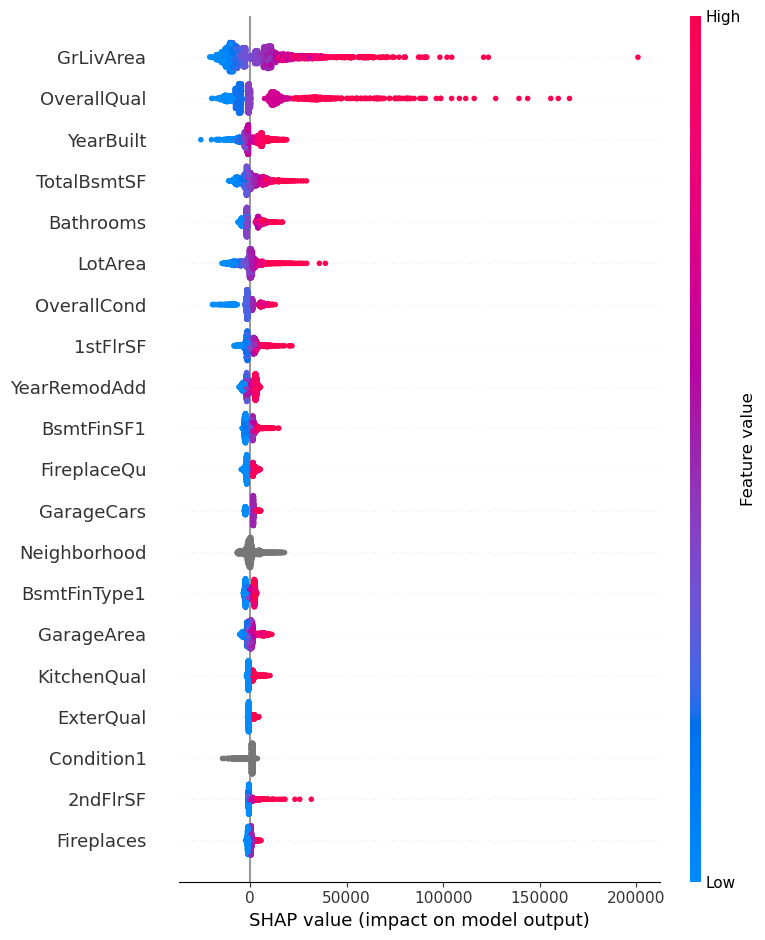

In [412]:
exp_xgb_OHE = shap.Explanation(dollar_shap_df_xgb.values, 
                       np.exp(shap_values_xgb.base_values),
                       X_new_order)

shap.summary_plot(exp_xgb_OHE, max_display= 20)

In [76]:
X.loc[X.Neighborhood == 'Crawfor']

,GrLivArea,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,PoolYN,PoolQC,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms
70,1316,70,RL,66.000000,8969,Pave,0.0,1,3,4,...,0,192,no,0.0,MnPrv,7,2008,WD,Normal,2.0
91,1308,50,RL,130.000000,9600,Pave,0.0,2,2,4,...,0,0,no,0.0,NO,6,2009,WD,Normal,2.5
117,1298,50,RL,51.000000,6821,Pave,0.0,1,2,4,...,0,0,no,0.0,NO,8,2007,WD,Normal,2.0
128,1696,20,RL,163.846926,20693,Pave,0.0,2,3,4,...,0,0,no,0.0,GdWo,2,2007,WD,Normal,2.0
197,1564,70,RL,75.000000,12000,Pave,0.0,1,3,4,...,0,0,no,0.0,NO,7,2009,WD,Normal,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2049,694,30,RL,40.000000,4280,Pave,0.0,1,4,4,...,0,0,no,0.0,MnPrv,3,2007,WD,Normal,1.0
2095,1671,50,RL,81.000000,8170,Pave,0.0,2,4,4,...,0,0,no,0.0,NO,2,2006,WD,Normal,2.0
2159,1461,70,RL,53.000000,7155,Pave,0.0,1,4,4,...,0,0,no,0.0,MnPrv,7,2007,WD,Normal,1.0
2234,1502,70,RL,60.000000,7200,Pave,0.0,1,2,4,...,0,0,no,0.0,MnPrv,2,2008,WD,Normal,1.5


In [415]:
y[10]

136000

In [414]:
xgb_OHE_predictions[10]

136826.7

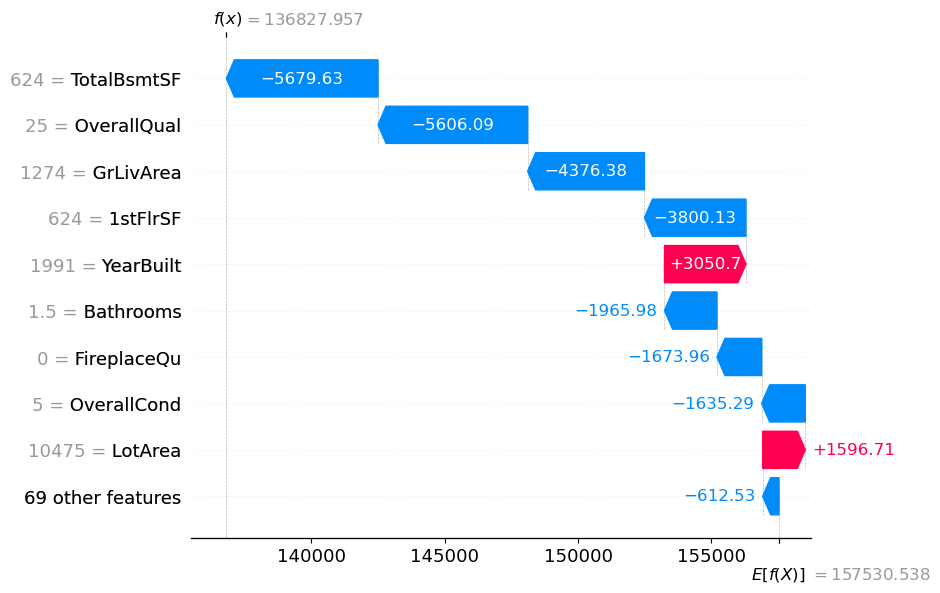

In [413]:
shap.waterfall_plot(exp_xgb_OHE[10])

# XGB SHAP 
## Ordinal encoded

 99%|===================| 2320/2333 [01:53<00:00]        

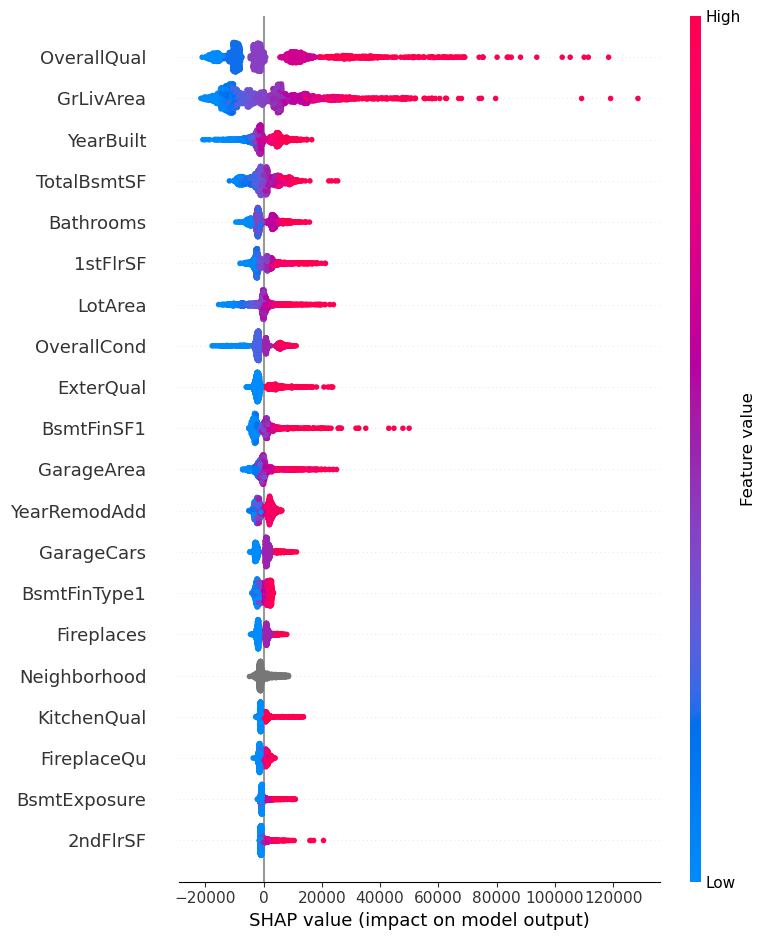

In [416]:
xgb_pipe_O.fit(X,y)

explainer_xgb_o = shap.Explainer(xgb_pipe_O.named_steps['XGB'],
                          masker = xgb_pipe_O.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_xgb_o = explainer_xgb_o(xgb_pipe_O.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = xgb_pipe_O.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_xgb_o = pd.DataFrame(shap_values_xgb_o.values, columns=transformed_feature_names)

shap_values_df_xgb_o.columns = shap_values_df_xgb_o.columns.str.replace('standard_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_xgb_o.columns = shap_values_df_xgb_o.columns.str.replace('encoder__', 
                                                                    '', 
                                                                    regex=False)

exp_xgb_O = shap.Explanation(shap_values_df_xgb_o.values, 
                           shap_values_xgb_o.base_values, 
                           X_new_order
                         )

shap.summary_plot(exp_xgb_O, max_display= 20)

In [417]:
xgb_O_predictions[10]

135833.05

In [418]:
y[10]

136000

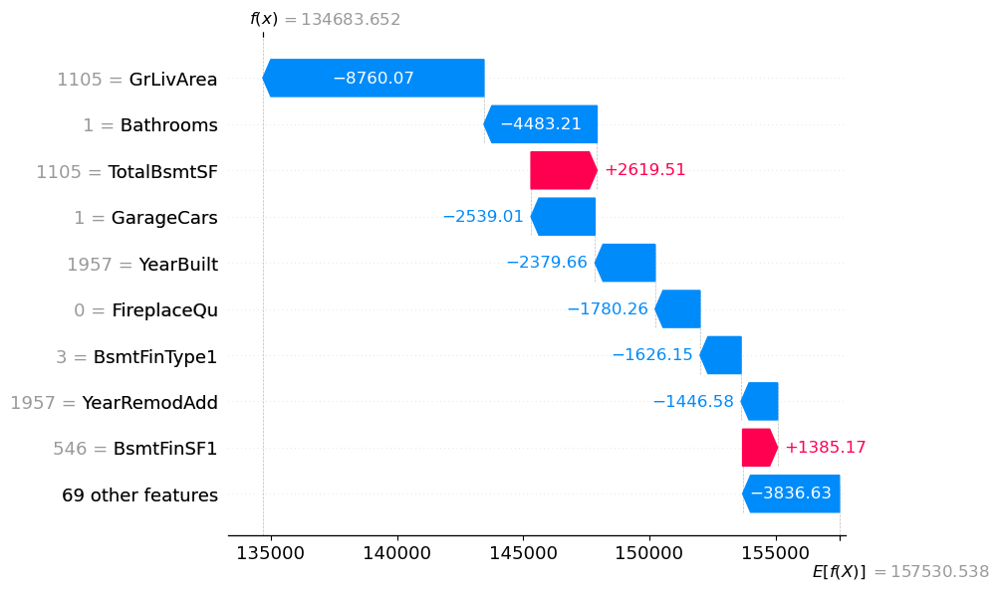

In [419]:
shap.waterfall_plot(exp_xgb_OHE[100])

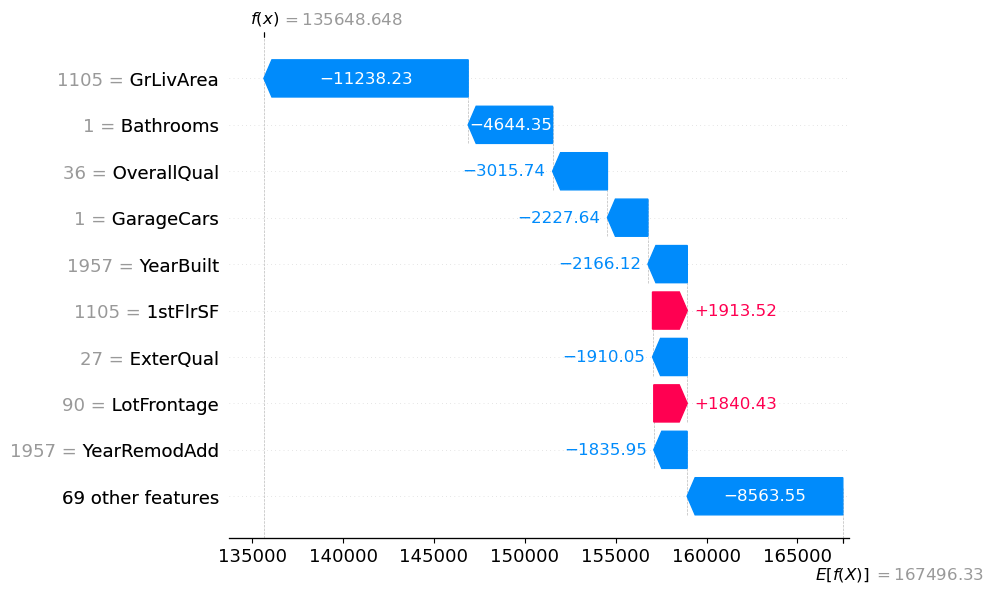

In [420]:
shap.waterfall_plot(exp_xgb_O[100])

# Comparing Lasso and XGB

In [341]:
df_predictions = df_normal_quality.copy()
df_predictions['Lasso'] = lasso_predictions
df_predictions['error_Lasso'] = df_predictions.SalePrice - df_predictions.Lasso
df_predictions['xgb'] = xgb_OHE_predictions
df_predictions['error_xgb'] = df_predictions.SalePrice - df_predictions.xgb
df_predictions[['SalePrice', 'Lasso',  'error_Lasso', 'xgb','error_xgb']]

,SalePrice,Lasso,error_Lasso,xgb,error_xgb
0,126000,125415.466896,584.533104,123684.312500,2315.687500
1,139500,130117.075047,9382.924953,136620.546875,2879.453125
2,124900,115860.949109,9039.050891,121025.015625,3874.984375
3,114000,105119.599868,8880.400132,112510.101562,1489.898438
4,227000,223692.819190,3307.180810,213293.171875,13706.828125
...,...,...,...,...,...
2328,121000,107054.707286,13945.292714,119838.703125,1161.296875
2329,139600,122905.260713,16694.739287,138721.578125,878.421875
2330,145000,153060.144009,-8060.144009,144983.687500,16.312500
2331,217500,224551.711010,-7051.711010,219554.656250,-2054.656250


In [343]:
data = pd.DataFrame({
    'GrLivArea': X['GrLivArea'],
    'OverallQual': X['OverallQual'],
    'Error': y - lasso_predictions
})

# Create the plot
fig = px.scatter(
    data, x='GrLivArea', y='Error',
    color=np.sqrt(X.OverallQual), 
    title=f'Lasso: Living Area vs. Prediction Error<br><sup>R2:{lasso_score:.4f} / std: {lasso_std:.4f} / Mean Absolute Error: ${lasso_mae:.2f}</sup>',
    labels={'GrLivArea': 'Above Ground Living Area (Square Feet)', 
            'Error': 'Error ($)',
            'color': ''}
)

# Add a horizontal line at y=0
fig.add_shape(type="line",
              x0=min(data['GrLivArea']), x1=max(data['GrLivArea']),
              y0=0, y1=0,
              line=dict(color="red", dash="dash"))


fig.update_layout(
    yaxis_range=[-100000, 100000],
    yaxis_title_standoff=0,
    height = 700, 
    width = 700
)

fig.add_annotation(
    x=1.1,  # Adjust the x position as needed
    y=1.1,  # Adjust the y position as needed
    text="Overall<br>Quality",  # Custom legend title with line break
    showarrow=False,
    xref="paper",
    yref="paper",
    align="left",
    font=dict(size=13)
)
# Show plot
fig.show()

fig.write_image("images/lasso_error.png")

In [344]:
data = pd.DataFrame({
    'GrLivArea': X['GrLivArea'],
    'OverallQual': X['OverallQual'],
    'Error': y - xgb_OHE_predictions
})

# Create the plot
fig = px.scatter(
    data, x='GrLivArea', y='Error',
    color=np.sqrt(X.OverallQual), 
    title=f'XGB: Living Area vs. Prediction Error<br><sup>R2: {xgb_score:.4f} / std: {xgb_std:.4f} / Mean Absolute Error: ${xgb_OHE_mae:.2f}</sup>',
    labels={'GrLivArea': 'Above Ground Living Area (Square Feet)', 
            'Error': 'Error ($)', 
            'color': ''}
)

# Add a horizontal line at y=0
fig.add_shape(type="line",
              x0=min(data['GrLivArea']), x1=max(data['GrLivArea']),
              y0=0, y1=0,
              line=dict(color="red", dash="dash"))

fig.update_layout(
    yaxis_range=[-100000, 100000],
    yaxis_title_standoff=0,
    height = 700, 
    width = 700
)

fig.add_annotation(
    x=1.1,  # Adjust the x position as needed
    y=1.1,  # Adjust the y position as needed
    text="Overall<br>Quality",  # Custom legend title with line break
    showarrow=False,
    xref="paper",
    yref="paper",
    align="left",
    font=dict(size=13)
)

# Show plot
fig.show()

fig.write_image("images/xgb_error.png")

In [315]:
df_predictions.loc[df_predictions.SalePrice == 230000].loc[df_predictions.OverallQual == 49]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
300,534102025,1492,230000,20,FV,80.000000,8000,Pave,0.0,1,...,NO,4,2010,WD,Normal,3.0,226568.680083,3431.319917,239935.031250,-9935.031250
530,916252170,1295,230000,120,RM,65.236303,8239,Pave,0.0,2,...,NO,11,2006,WD,Normal,2.0,137563.529643,92436.470357,182751.375000,47248.625000
1079,534151120,2288,230000,60,RL,109.062367,13774,Pave,0.0,2,...,NO,11,2009,WD,Normal,2.0,259129.677466,-29129.677466,232575.875000,-2575.875000
1201,528175060,1314,230000,120,RL,34.000000,5001,Pave,0.0,2,...,NO,7,2009,WD,Normal,3.0,198199.069927,31800.930073,212951.515625,17048.484375
1240,528294070,2291,230000,60,RL,66.000000,8738,Pave,0.0,2,...,NO,2,2006,WD,Normal,2.5,227256.267821,2743.732179,223168.937500,6831.062500
1461,907194010,1840,230000,60,RL,79.000000,12420,Pave,0.0,1,...,NO,6,2009,WD,Normal,3.5,218029.965183,11970.034817,217467.031250,12532.968750
1878,907265030,1654,230000,20,RL,64.333653,8125,Pave,0.0,1,...,NO,2,2006,WD,Normal,3.0,233972.185278,-3972.185278,232903.687500,-2903.687500


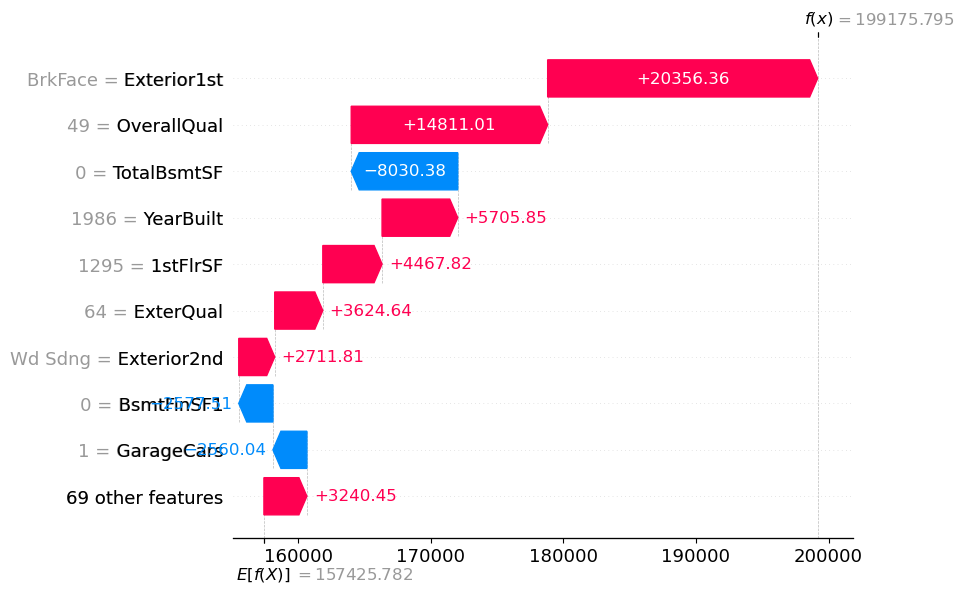

In [311]:
shap.waterfall_plot(exp_xgb_OHE[530])

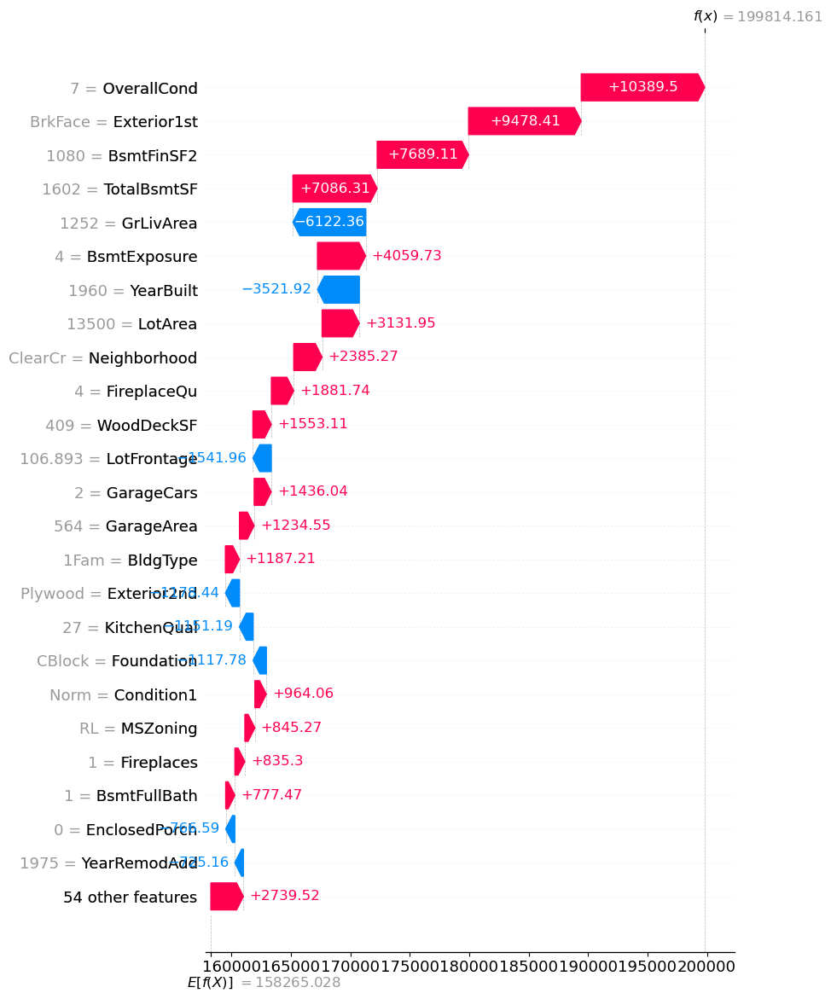

In [322]:
shap.waterfall_plot(exp_lasso[1045], max_display= 25)

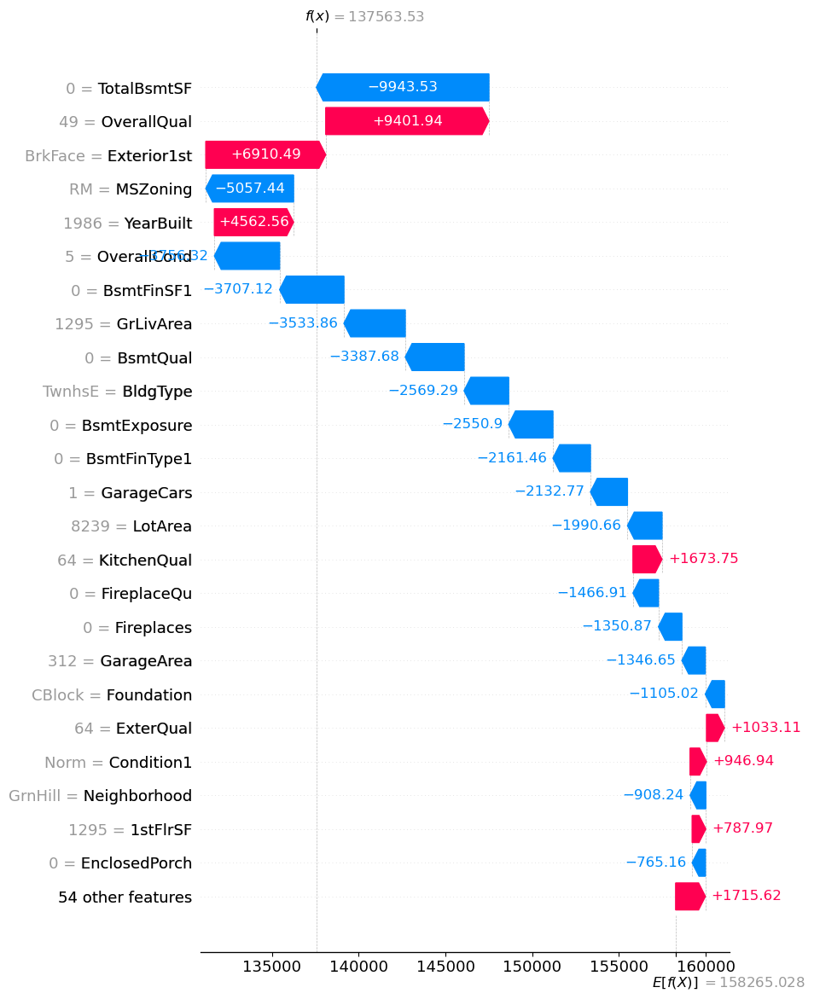

In [318]:
shap.waterfall_plot(exp_lasso[530], max_display= 25)

In [323]:
df_predictions.loc[df_predictions.GrLivArea == 2640]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
20,902326030,2640,265979,70,RM,65.0,11700,Pave,2.0,2,...,NO,5,2009,WD,Normal,1.5,215785.962954,50193.037046,260369.796875,5609.203125
2044,535353180,2640,180000,190,RL,94.0,22136,Pave,0.0,1,...,NO,7,2006,WD,Normal,4.5,207387.878477,-27387.878477,183139.234375,-3139.234375


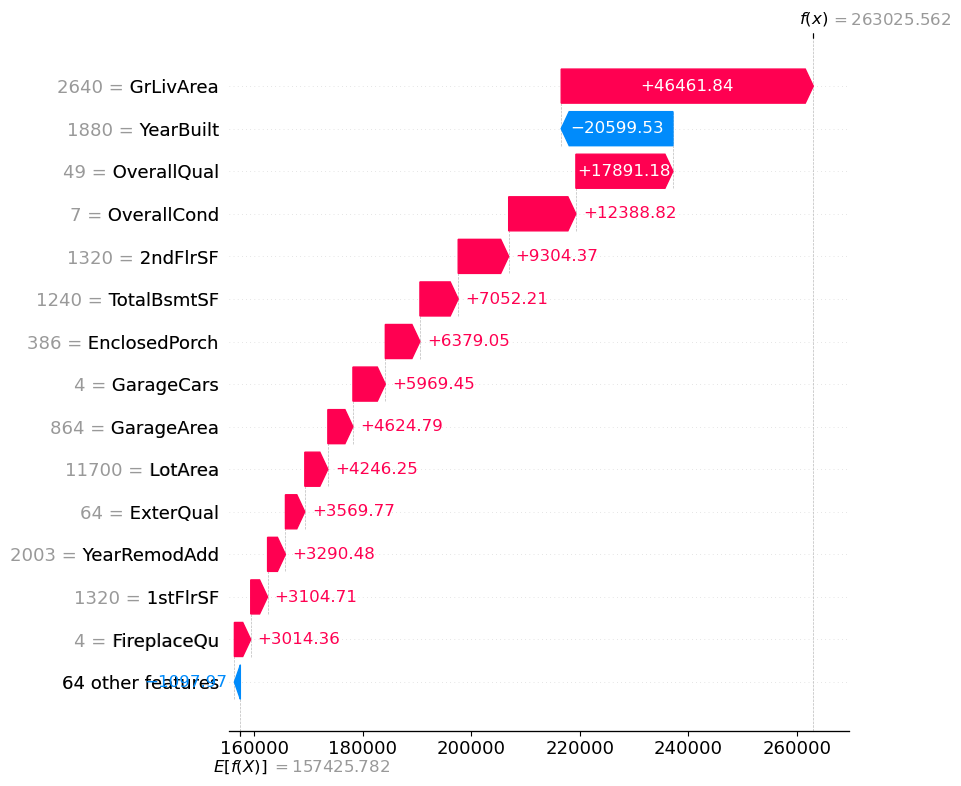

In [332]:
shap.waterfall_plot(exp_xgb_OHE[20], max_display= 15)

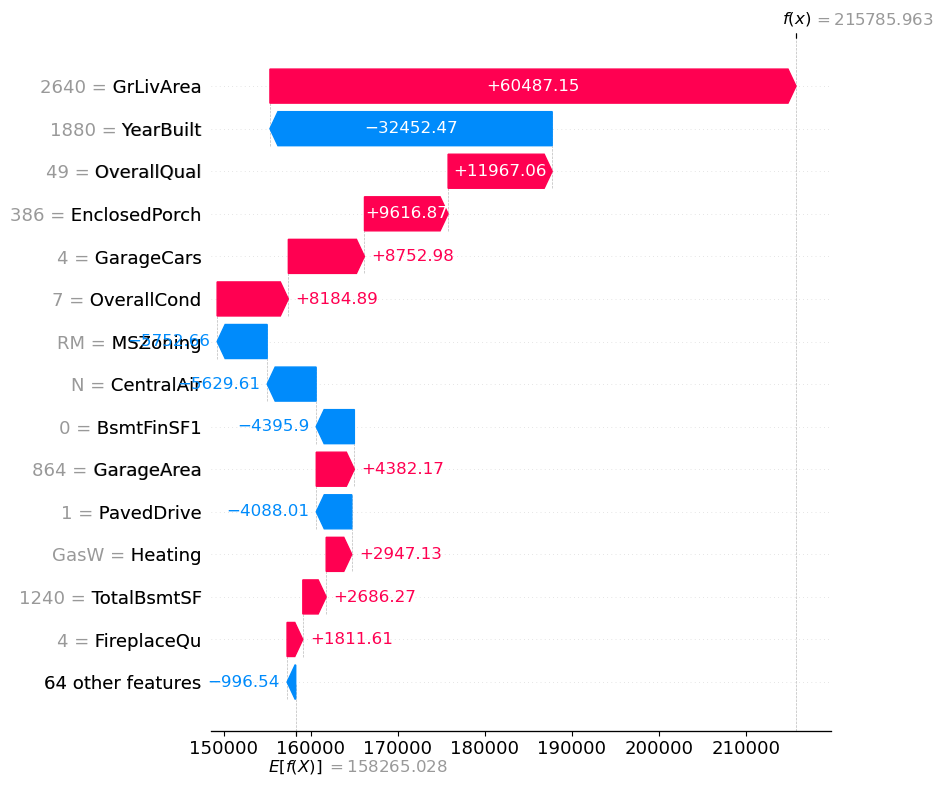

In [331]:
shap.waterfall_plot(exp_lasso[20], max_display= 15)

# Neighborhood

In [338]:
# Sort the data by shap_values_df_lasso_comb.Neighborhood
sorted_indices = dollar_shap_df_lasso.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = dollar_shap_df_lasso.Neighborhood[sorted_indices]
sorted_shap_values_xgb = dollar_shap_df_xgb.Neighborhood[sorted_indices]

# Create traces
trace1 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_xgb,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_lasso,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Neighborhood SHAP Values',
    xaxis=dict(title='Neighborhood'),
    yaxis=dict(title='SHAP Values ($)'),
        legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)


fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 800)

fig.show()

fig.write_image("images/neighborhood.png")


In [339]:
# Sort the data by shap_values_df_lasso_comb.Neighborhood
sorted_indices = dollar_shap_df_lasso.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = shap_values_df_lasso_log.Neighborhood[sorted_indices]
sorted_shap_values_xgb = shap_values_df_xgb_log.Neighborhood[sorted_indices]


# Create traces
trace1 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_xgb,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_lasso,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Neighborhood SHAP Values',
    xaxis=dict(title='Neighborhood'),
    yaxis=dict(title='SHAP Values (log $)'),
    legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 800)

fig.show()
fig.write_image("images/neighborhood_log.png")



In [407]:
df_predictions.loc[df_predictions.Neighborhood == 'NAmes'].GrLivArea.mean()

1275.9641943734016

In [408]:
df_predictions.loc[df_predictions.Neighborhood == 'BrkSide'].GrLivArea.mean()

1244.9789473684211

In [370]:
df_predictions.loc[df_predictions.Neighborhood == 'SWISU'].OverallQual.mean()

31.289473684210527

In [371]:
df_predictions.loc[df_predictions.Neighborhood == 'SWISU'].SalePrice.mean()

132414.47368421053

In [381]:
y[1184]

195000

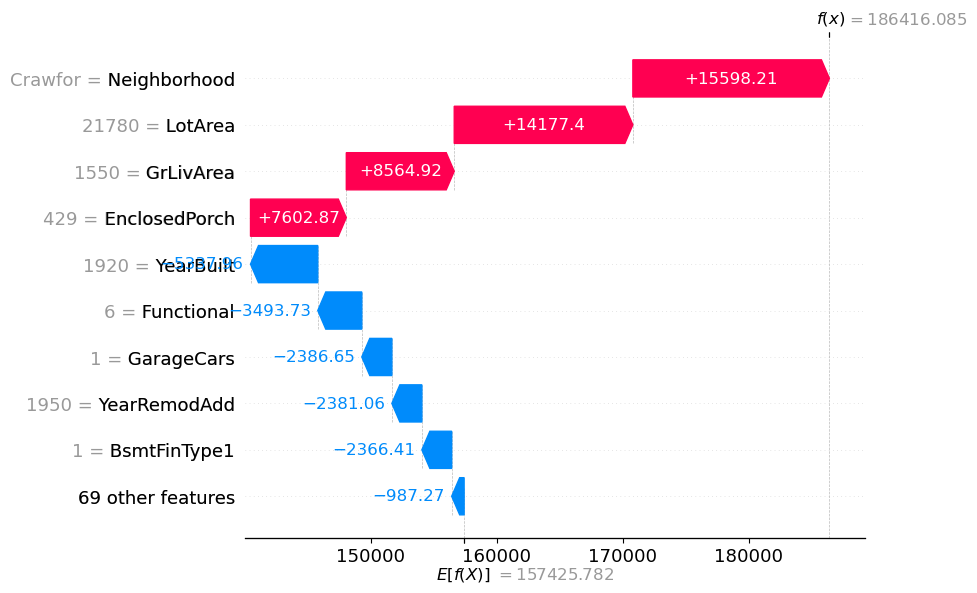

In [382]:
shap.waterfall_plot(exp_xgb_OHE[1184])

In [383]:
y[1251]

140000

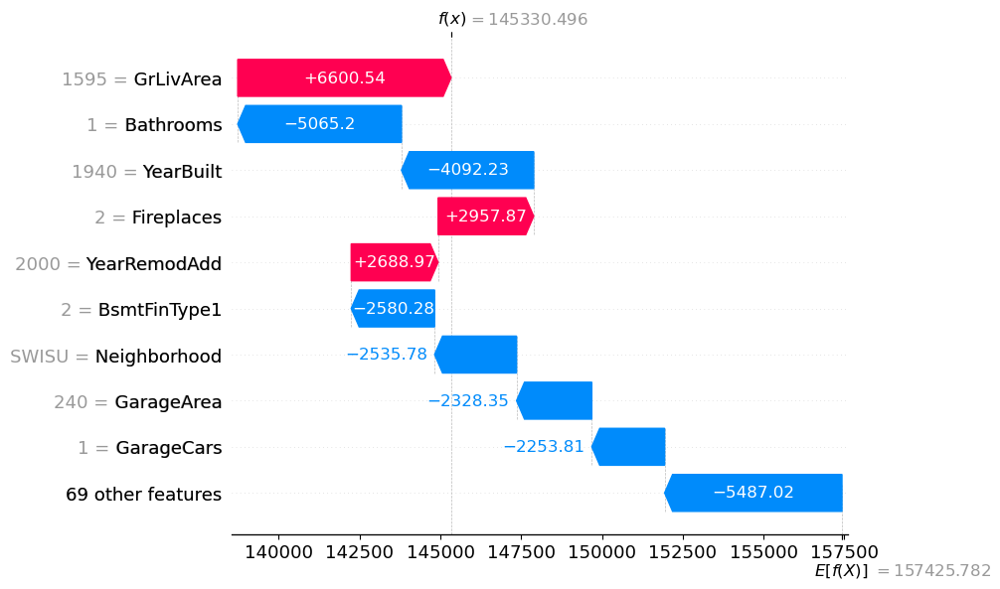

In [378]:
shap.waterfall_plot(exp_xgb_OHE[1251])

In [367]:
sorted_indices = dollar_shap_df_xgb.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = dollar_shap_df_lasso.Neighborhood[sorted_indices]
sorted_shap_values_xgb = dollar_shap_df_xgb.Neighborhood[sorted_indices]
sorted_quality = X.OverallQual[sorted_indices]

fig = px.scatter(
    x=sorted_neighborhoods, 
    y=sorted_shap_values_xgb, 
    color = np.sqrt(sorted_quality),
    labels={'x': 'Neighborhood', 'y': 'Neighborhood SHAP Values ($)',
           'color' : "Overall <br>Quality"},
    title='Neighborhood vs Neighborhood SHAP Values'
)
fig.update_layout(
    title=dict(y=0.9))
# Show the plot
fig.show()
fig.write_image("images/neighborhood_xgb.png")


In [386]:
 test = pd.DataFrame(df_predictions.loc[df_predictions.Neighborhood == 'Crawfor'].describe() - df_predictions.loc[df_predictions.Neighborhood == 'SWISU'].describe()) 

In [400]:
test.iloc[1].tail(20)

FireplaceQu          1.211930
GarageFinish         0.558947
GarageCars           0.586667
GarageArea         138.558246
GarageQual           0.472281
GarageCond           0.407018
PavedDrive           0.168772
WoodDeckSF         -12.873684
OpenPorchSF         -9.151579
EnclosedPorch       -8.970175
3SsnPorch            5.306667
ScreenPorch         35.552281
PoolQC               0.066667
MoSold               1.204561
YrSold              -0.478246
Bathrooms           -0.059298
Lasso            55637.368183
error_Lasso       4110.451466
xgb              59138.312500
error_xgb          609.495918
Name: mean, dtype: float64

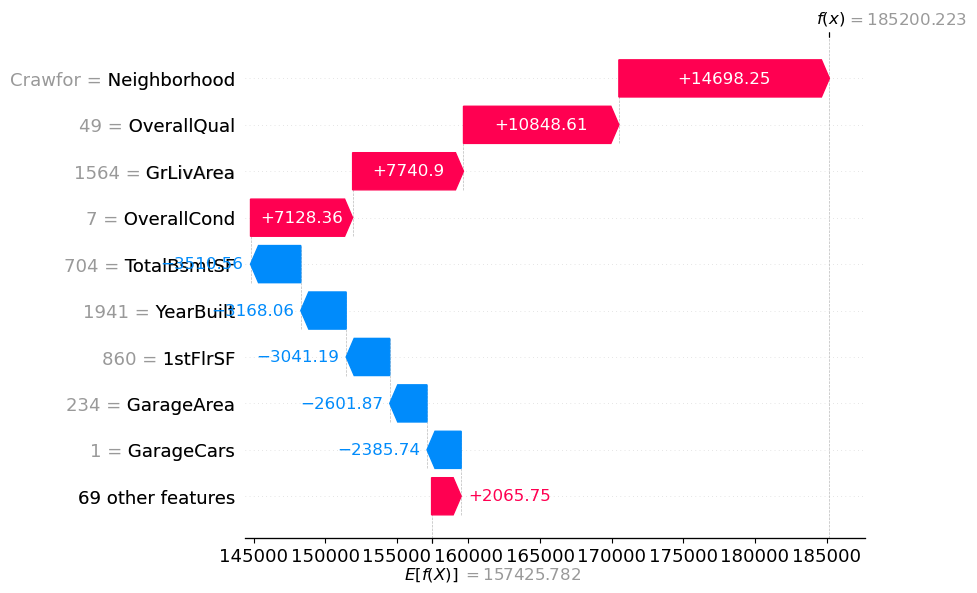

In [275]:
shap.waterfall_plot(exp_xgb_OHE[197], max_display=10)

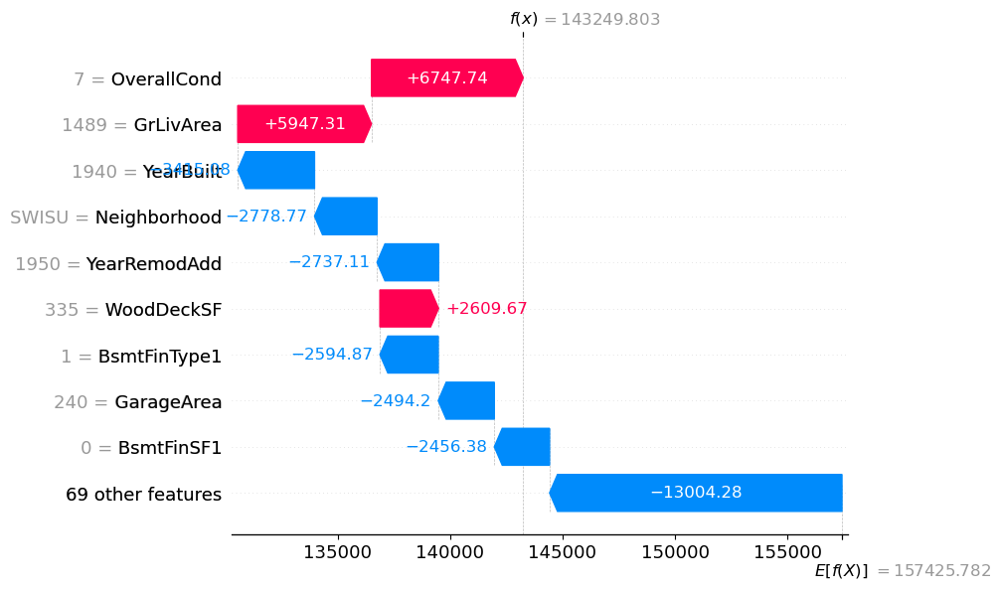

In [274]:
shap.waterfall_plot(exp_xgb_OHE[1851], max_display=10)

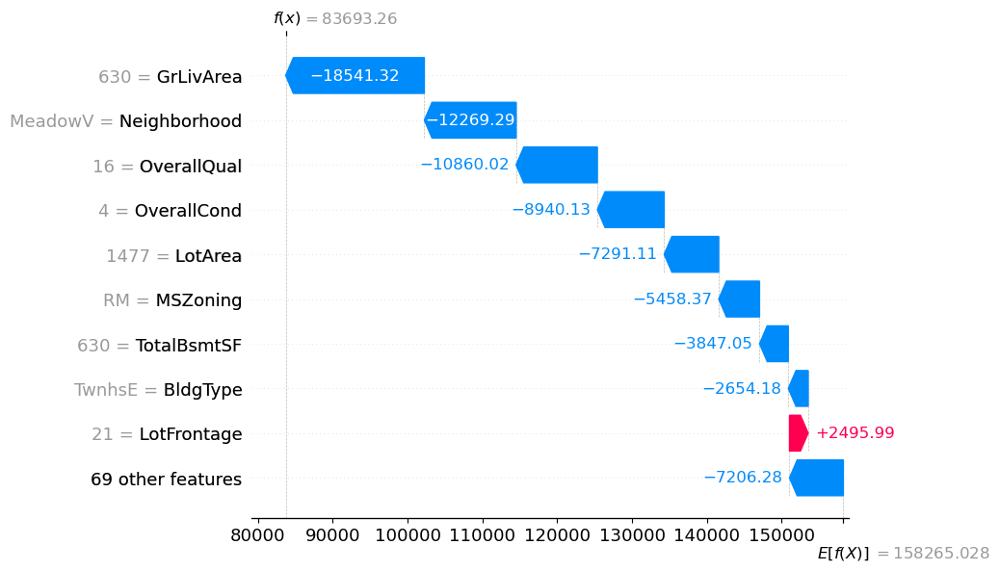

In [219]:
shap.waterfall_plot(exp_lasso[627], max_display=10)

In [213]:
df_predictions.loc[df_predictions.Neighborhood == 'Crawfor']
#.sort_values('SalePrice', ascending = False)

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
70,909251080,1316,145000,70,RL,66.000000,8969,Pave,0.0,1,...,MnPrv,7,2008,WD,Normal,2.0,147185.115979,-2185.115979,146910.984375,-1910.984375
91,909276200,1308,160000,50,RL,130.000000,9600,Pave,0.0,2,...,NO,6,2009,WD,Normal,2.5,143046.902564,16953.097436,155616.906250,4383.093750
117,909251040,1298,146500,50,RL,51.000000,6821,Pave,0.0,1,...,NO,8,2007,WD,Normal,2.0,150097.552686,-3597.552686,148206.171875,-1706.171875
128,909475050,1696,198000,20,RL,163.846926,20693,Pave,0.0,2,...,GdWo,2,2007,WD,Normal,2.0,225418.318754,-27418.318754,214025.703125,-16025.703125
197,909425060,1564,174500,70,RL,75.000000,12000,Pave,0.0,1,...,NO,7,2009,WD,Normal,1.5,175901.464506,-1401.464506,187101.421875,-12601.421875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2049,909254140,694,90350,30,RL,40.000000,4280,Pave,0.0,1,...,MnPrv,3,2007,WD,Normal,1.0,106726.524327,-16376.524327,91488.304688,-1138.304688
2095,909280070,1671,218000,50,RL,81.000000,8170,Pave,0.0,2,...,NO,2,2006,WD,Normal,2.0,191777.390701,26222.609299,208853.765625,9146.234375
2159,909254100,1461,135000,70,RL,53.000000,7155,Pave,0.0,1,...,MnPrv,7,2007,WD,Normal,1.0,150462.053373,-15462.053373,148236.703125,-13236.703125
2234,909275050,1502,149000,70,RL,60.000000,7200,Pave,0.0,1,...,MnPrv,2,2008,WD,Normal,1.5,159193.051915,-10193.051915,157914.875000,-8914.875000


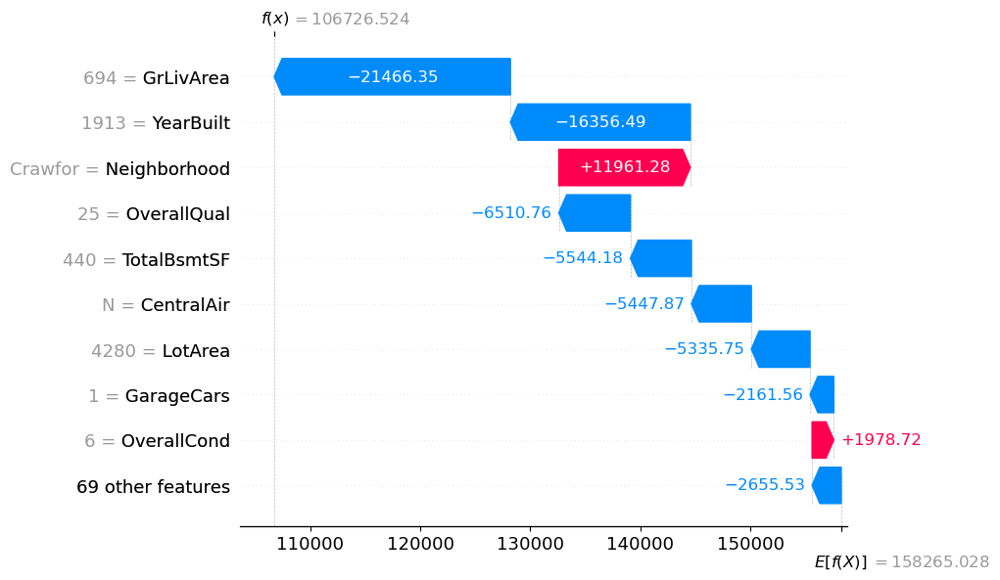

In [222]:
shap.waterfall_plot(exp_lasso[2049], max_display=10)

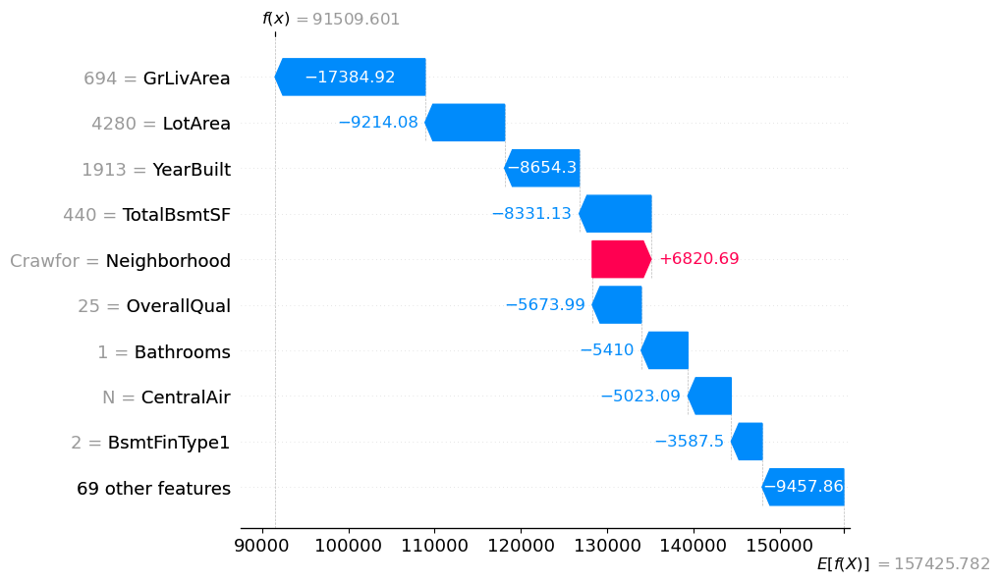

In [223]:
shap.waterfall_plot(exp_xgb_OHE[2049], max_display=10)

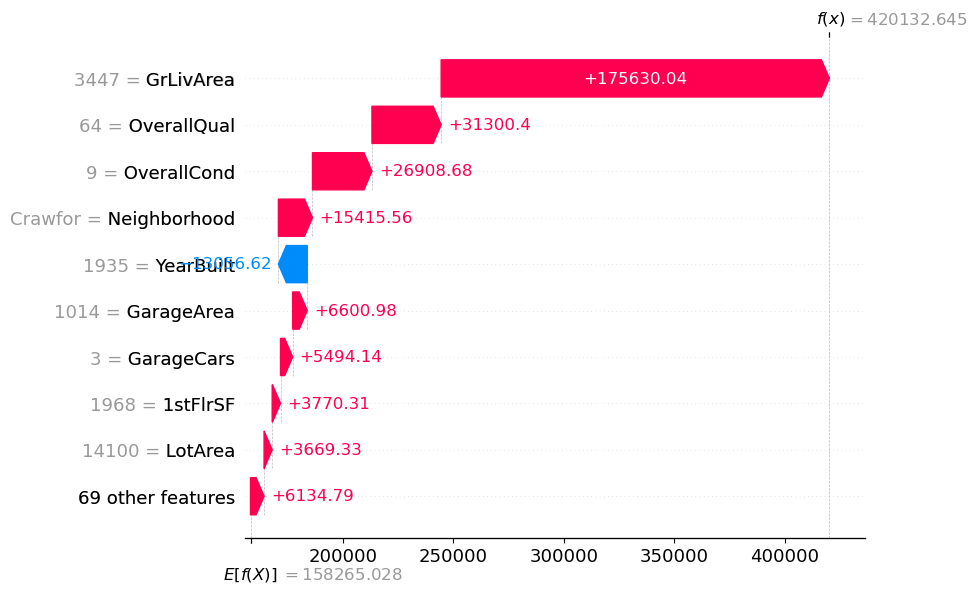

In [215]:
shap.waterfall_plot(exp_lasso[408], max_display=10)

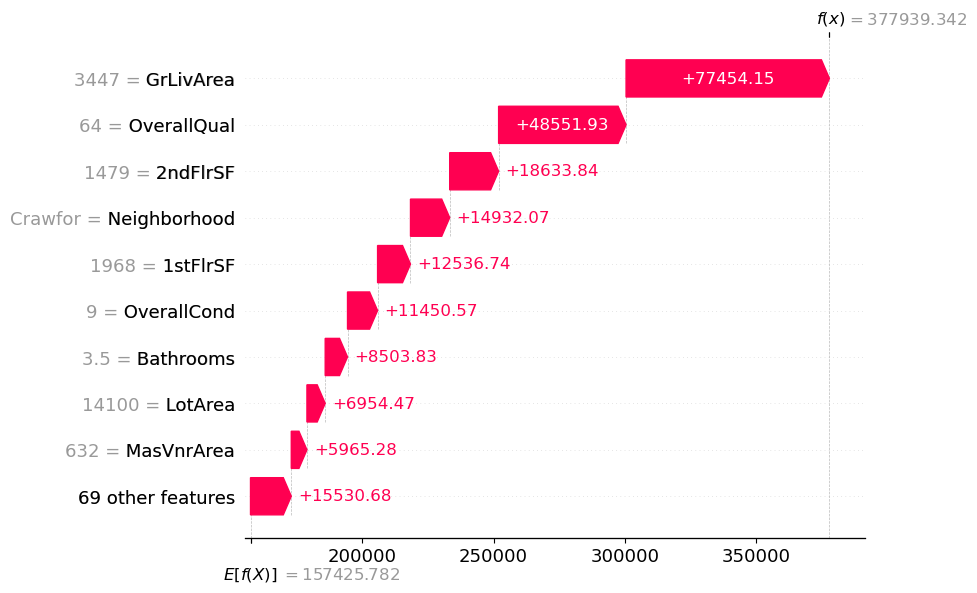

In [184]:
shap.waterfall_plot(exp_xgb_OHE[408], max_display=10)

In [209]:
color = X.Neighborhood

color_transformed = []
for word in color:
    if word == 'Crawfor':
        color_transformed.append('Crawfor')
    elif word == 'BrkSide':
        color_transformed.append('BrkSide')
    elif word == 'ClearCr':
        color_transformed.append('ClearCr')
    else:
        color_transformed.append('other')
    
fig = px.scatter(
    x=np.sqrt(X.OverallQual), 
    y=dollar_shap_df_xgb.Neighborhood, 
    color = color_transformed,
    labels={'x': 'Overall Quality', 'y': 'Neighborhood SHAP Values ($)', 'color' : 'Neighborhood'},
    title='Overall Quality vs Neighborhood SHAP Values (XGBoost)'
) 
fig.update_layout(
    title=dict(y=0.85))
# Show the plot
fig.show()
fig.write_image("images/neighborhood_xgb_specific.png")


# Living Area

In [122]:
trace1 = go.Scatter(
    x= X.GrLivArea,
    y=shap_values_df_xgb_log.GrLivArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GrLivArea,
    y= shap_values_df_lasso_log.GrLivArea,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Living Area SHAP Values',
    xaxis=dict(title='Above Ground Living Area (square feet)'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)
    
fig.show()
fig.write_image("images/living_area_SHAP_log.png")


In [123]:
trace1 = go.Scatter(
    x= X.GrLivArea,
    y=dollar_shap_df_xgb.GrLivArea,
    mode='markers',
    name='XGB',
    opacity= 1
)
trace2 = go.Scatter(
    x= X.GrLivArea,
    y= dollar_shap_df_lasso.GrLivArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Living Area SHAP Values',
    xaxis=dict(title='Above Ground Living Area (square feet)'),
    yaxis=dict(title='SHAP Value'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/living_area_SHAP.png")


In [107]:
df_predictions.loc[df_predictions.GrLivArea == 1500]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
752,906382060,1500,212999,20,RL,73.0,8760,Pave,0.0,1,...,NO,6,2007,WD,Normal,2.0,220991.874644,-7992.874644,224229.43750,-11230.43750
1228,907414020,1500,190000,20,RL,63.0,8487,Pave,0.0,1,...,NO,8,2009,WD,Normal,2.0,195801.051857,-5801.051857,192976.78125,-2976.78125


In [101]:
df_predictions.loc[df_predictions.GrLivArea > 3500]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
807,528351010,4316,755000,60,RL,104.0,21535,Pave,0.0,2,...,NO,1,2007,WD,Normal,4.0,839546.443416,-84546.443416,715780.37500,39219.62500
1116,528320060,3627,625000,60,RL,118.0,35760,Pave,0.0,2,...,NO,7,2006,WD,Normal,4.5,656765.351366,-31765.351366,626883.18750,-1883.18750
1777,902400110,3608,475000,75,RM,90.0,22950,Pave,0.0,3,...,GdPrv,6,2006,WD,Normal,2.5,420226.359296,54773.640704,462474.96875,12525.03125


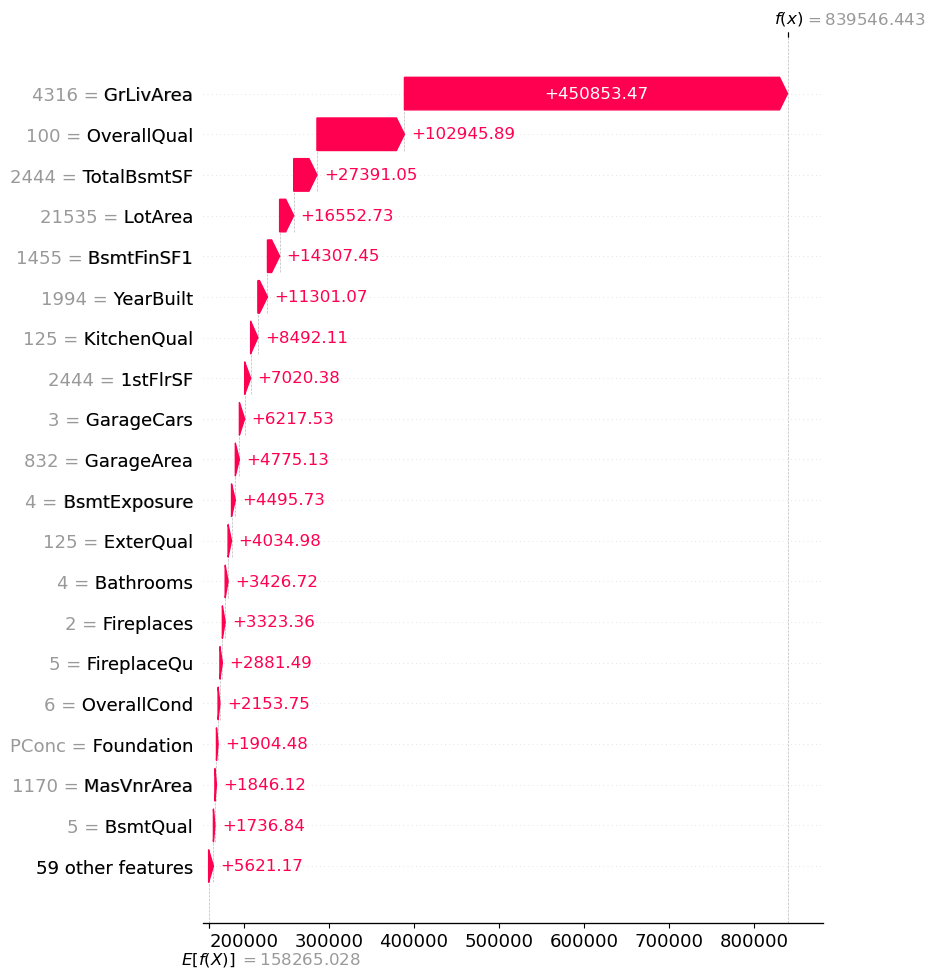

In [98]:
shap.waterfall_plot(exp_lasso[807], max_display= 20)

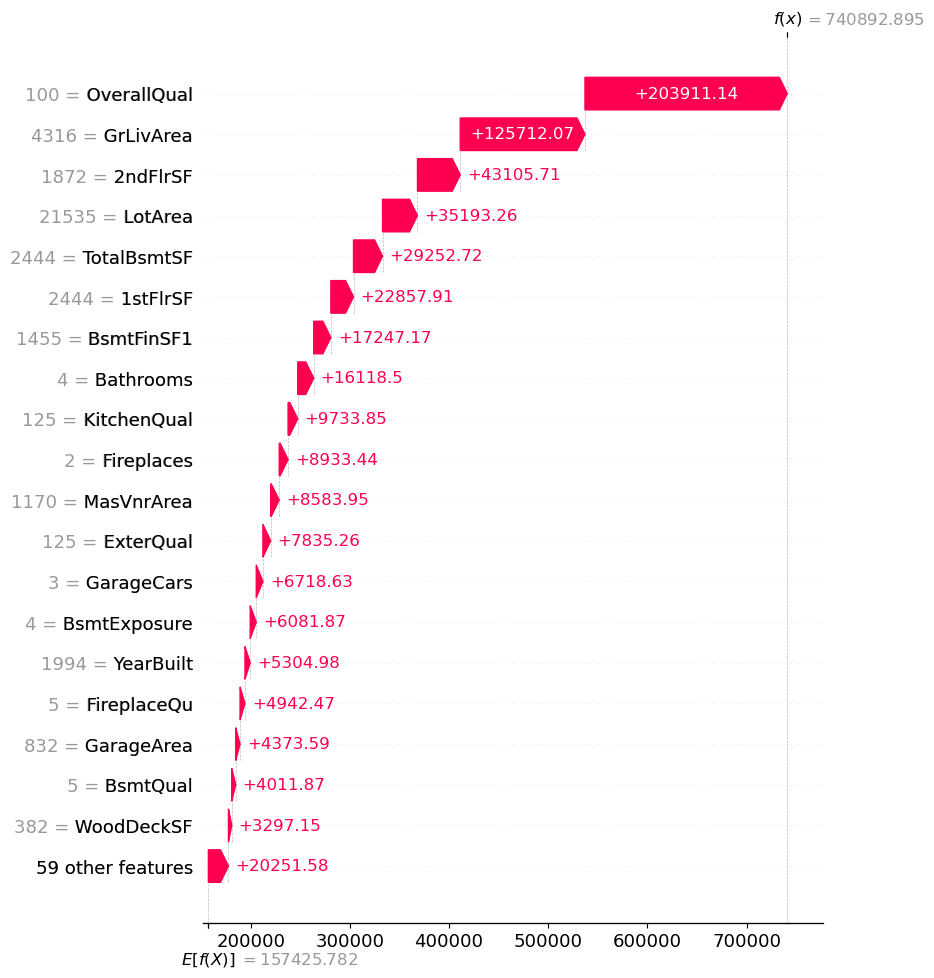

In [99]:
shap.waterfall_plot(exp_xgb_OHE[807], max_display= 20)

In [342]:
df_predictions.iloc[807]

PID                528351010
GrLivArea               4316
SalePrice             755000
MSSubClass                60
MSZoning                  RL
                   ...      
Bathrooms                4.0
Lasso          839546.443416
error_Lasso    -84546.443416
xgb                 740903.0
error_xgb            14097.0
Name: 807, Length: 84, dtype: object

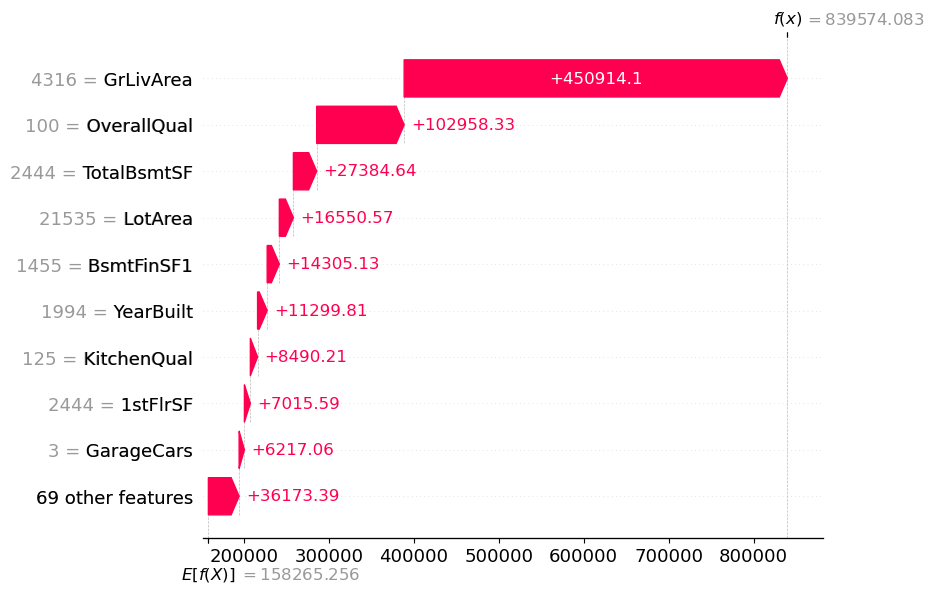

In [157]:
shap.waterfall_plot(exp_lasso[807])

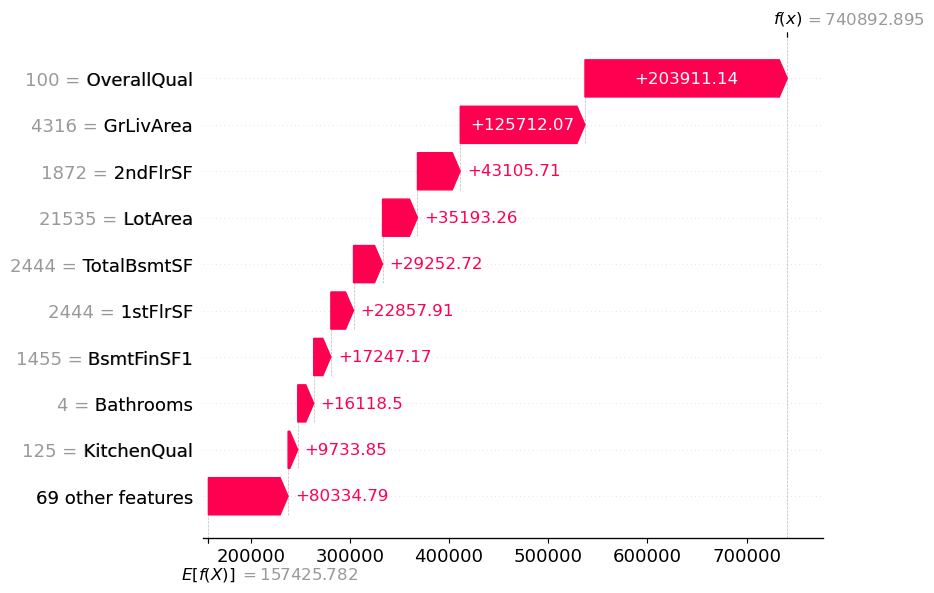

In [158]:
shap.waterfall_plot(exp_xgb_OHE[807])

# Overall Quality

In [125]:
trace1 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y=shap_values_df_xgb_log.OverallQual,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y= shap_values_df_lasso_log.OverallQual,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Quality SHAP Values',
    xaxis=dict(title='Quality'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/overall_qual_SHAP_log.png")


In [127]:
trace1 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y=dollar_shap_df_xgb.OverallQual,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y= dollar_shap_df_lasso.OverallQual,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Quality SHAP Values',
    xaxis=dict(title='Quality'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/overall_qual_SHAP.png")


In [149]:
df_predictions.loc[df_predictions.OverallQual == 1]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
731,534450090,334,39300,20,RL,50.00000,5000,Pave,0.0,1,...,NO,1,2007,WD,Normal,1.0,57241.260493,-17941.260493,40347.078125,-1047.078125
1026,904301375,904,61000,30,RL,79.33824,10020,Pave,0.0,2,...,NO,3,2009,WD,Normal,1.5,60954.038920,45.961080,61709.214844,-709.214844
1968,923125030,1600,81500,20,A (agr),125.00000,31250,Pave,0.0,1,...,NO,5,2006,WD,Normal,1.5,89447.323785,-7947.323785,83286.820312,-1786.820312


In [138]:
df_predictions.loc[df_predictions.OverallQual == 64].loc[df_predictions.GrLivArea < 2000]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
4,534177230,1665,227000,60,RL,70.000000,8400,Pave,0.0,1,...,NO,11,2009,WD,Normal,3.5,223692.819190,3307.180810,215350.781250,11649.218750
9,528186170,1342,219500,120,RL,48.000000,6240,Pave,0.0,1,...,NO,2,2008,WD,Normal,2.0,206279.400945,13220.599055,208454.593750,11045.406250
22,916386140,1466,201000,20,RL,73.000000,8925,Pave,0.0,2,...,NO,7,2009,WD,Normal,2.0,220871.904351,-19871.904351,217750.312500,-16750.312500
53,528186180,1324,254000,120,RL,48.000000,6240,Pave,0.0,1,...,NO,12,2009,WD,Normal,3.0,221142.245203,32857.754797,232938.125000,21061.875000
58,528429110,1464,282922,20,RL,49.000000,15256,Pave,0.0,2,...,NO,8,2007,WD,Normal,3.0,261093.485847,21828.514153,263480.656250,19441.343750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2266,528435050,1702,275500,20,RL,85.000000,10130,Pave,0.0,1,...,NO,3,2009,WD,Normal,3.0,295224.982208,-19724.982208,292181.000000,-16681.000000
2271,907275140,1828,279500,20,RL,101.207723,12782,Pave,0.0,1,...,NO,6,2009,WD,Normal,3.0,285645.512124,-6145.512124,284515.281250,-5015.281250
2274,527182040,1088,170000,120,RL,29.264884,3696,Pave,0.0,1,...,NO,10,2007,WD,Normal,1.5,163405.502922,6594.497078,157315.437500,12684.562500
2275,528120020,1717,255500,20,RL,87.000000,11146,Pave,0.0,2,...,NO,7,2009,WD,Normal,2.0,261219.274329,-5719.274329,265977.031250,-10477.031250


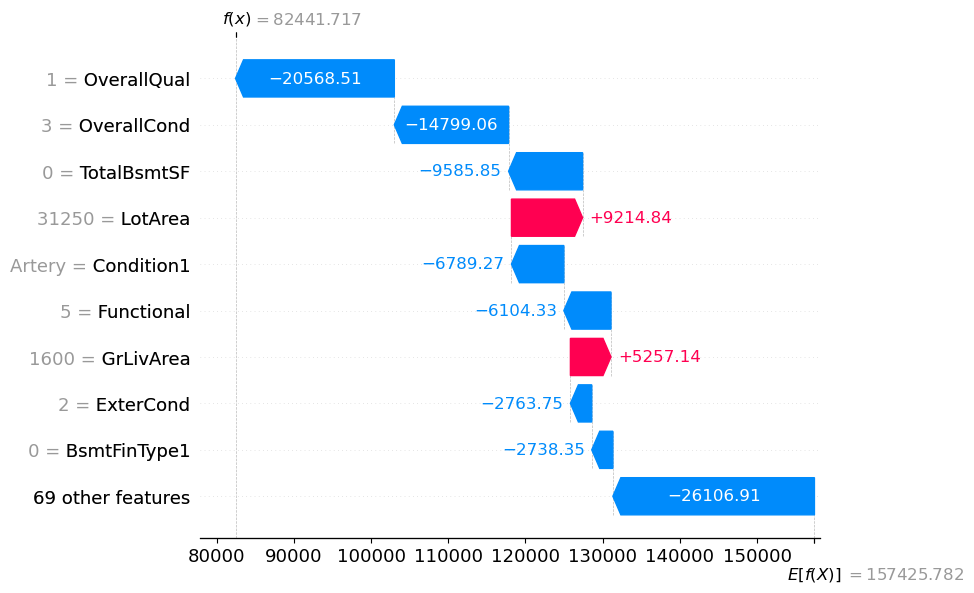

In [150]:
shap.waterfall_plot(exp_xgb_OHE[1968])

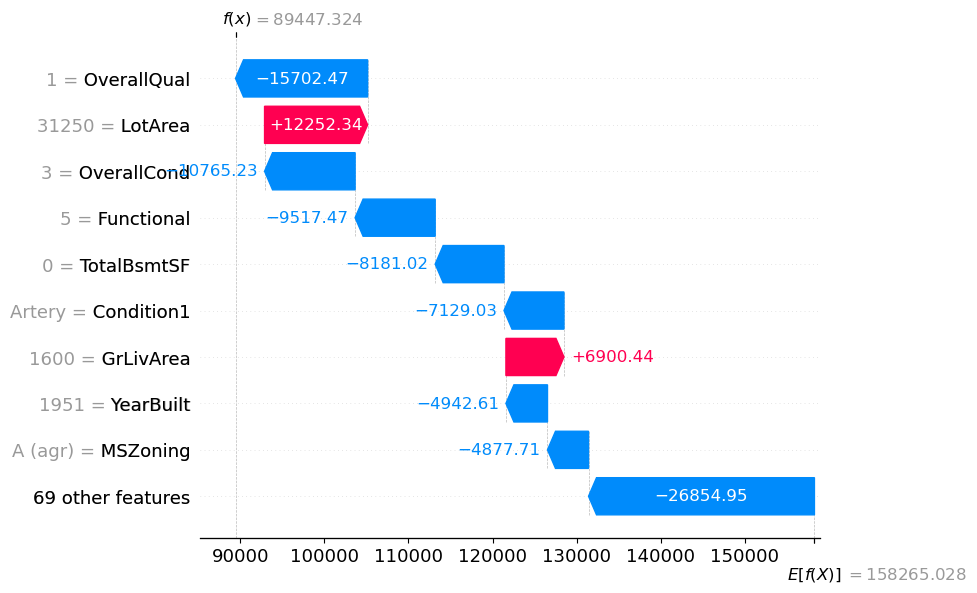

In [151]:
shap.waterfall_plot(exp_lasso[1968])

# Year Built

In [334]:
trace1 = go.Scatter(
    x=X.YearBuilt,
    y=dollar_shap_df_xgb.YearBuilt,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.YearBuilt,
    y= dollar_shap_df_lasso.YearBuilt,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='YearBuiltSHAP Values',
    xaxis=dict(title='YearBuilt'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/Lot_area_SHAP_log.png")


# Lot Area 

In [196]:
trace1 = go.Scatter(
    x=X.LotArea,
    y=shap_values_df_xgb_log.LotArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.LotArea,
    y= shap_values_df_lasso_log.LotArea,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Lot Area SHAP Values',
    xaxis=dict(title='Lot Area (square feet)'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/Lot_area_SHAP_log.png")


In [197]:
trace1 = go.Scatter(
    x=X.LotArea,
    y=dollar_shap_df_xgb.LotArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.LotArea,
    y= dollar_shap_df_lasso.LotArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Lot Area SHAP Values',
    xaxis=dict(title='Lot Area (square feet)'),
    yaxis=dict(title='SHAP Values ($)'),
)


fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/Lot_area_SHAP.png")


# Garage Cars

In [198]:

trace1 = go.Scatter(
    x=X.GarageCars,
    y=shap_values_df_xgb_log.GarageCars,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageCars,
    y= shap_values_df_lasso_log.GarageCars,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Garage Cars SHAP Values',
    xaxis=dict(title='Cars'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/garage_cars_SHAP_log.png")


In [199]:

trace1 = go.Scatter(
    x=X.GarageCars,
    y=dollar_shap_df_xgb.GarageCars,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageCars,
    y= dollar_shap_df_lasso.GarageCars,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Garage Cars SHAP Values',
    xaxis=dict(title='Cars'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/garage_cars_SHAP.png")


# Garage Size

In [336]:

trace1 = go.Scatter(
    x=X.GarageArea,
    y=dollar_shap_df_xgb.GarageArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageArea,
    y= dollar_shap_df_lasso.GarageArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Garage Area SHAP Values',
    xaxis=dict(title='Garage Area (Square Feet)'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/garage_cars_SHAP.png")


# Year Built

In [177]:

trace1 = go.Scatter(
    x=X.YearBuilt,
    y=dollar_shap_df_xgb.YearBuilt,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.YearBuilt,
    y= dollar_shap_df_lasso.YearBuilt,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Year Built SHAP Values',
    xaxis=dict(title='Year Built'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/garage_cars_SHAP.png")


# Bathrooms

In [168]:
df_predictions.loc[df_predictions.Bathrooms == 3.5]

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
4,534177230,1665,227000,60,RL,70.000000,8400,Pave,0.0,1,...,NO,11,2009,WD,Normal,3.5,223692.819190,3307.180810,215350.781250,11649.218750
24,534128010,2090,200000,60,RL,82.204552,10382,Pave,0.0,2,...,NO,11,2009,WD,Normal,3.5,234024.999849,-34024.999849,217382.000000,-17382.000000
25,528106110,2046,450000,20,RL,105.000000,15431,Pave,0.0,1,...,NO,8,2007,WD,Normal,3.5,448002.164450,1997.835550,469464.093750,-19464.093750
51,528164060,2470,615000,20,RL,106.000000,12720,Pave,0.0,1,...,NO,2,2008,WD,Normal,3.5,550652.010521,64347.989479,594268.125000,20731.875000
56,528231020,1374,184500,80,RL,67.000000,13300,Pave,0.0,2,...,NO,6,2010,WD,Normal,3.5,188932.209687,-4432.209687,181530.937500,2969.062500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2308,528250040,1342,178000,60,RL,64.721634,8174,Pave,0.0,2,...,NO,5,2009,WD,Normal,3.5,186845.152095,-8845.152095,181198.687500,-3198.687500
2309,907262030,1768,224900,60,RL,65.000000,8158,Pave,0.0,1,...,NO,7,2008,WD,Normal,3.5,207692.081160,17207.918840,211658.531250,13241.468750
2310,907285040,2090,240000,60,RL,80.000000,10000,Pave,0.0,1,...,NO,12,2007,WD,Normal,3.5,263505.483852,-23505.483852,252750.921875,-12750.921875
2314,533217060,1404,170000,160,FV,24.000000,2160,Pave,2.0,1,...,NO,6,2008,WD,Normal,3.5,172631.764949,-2631.764949,171998.921875,-1998.921875


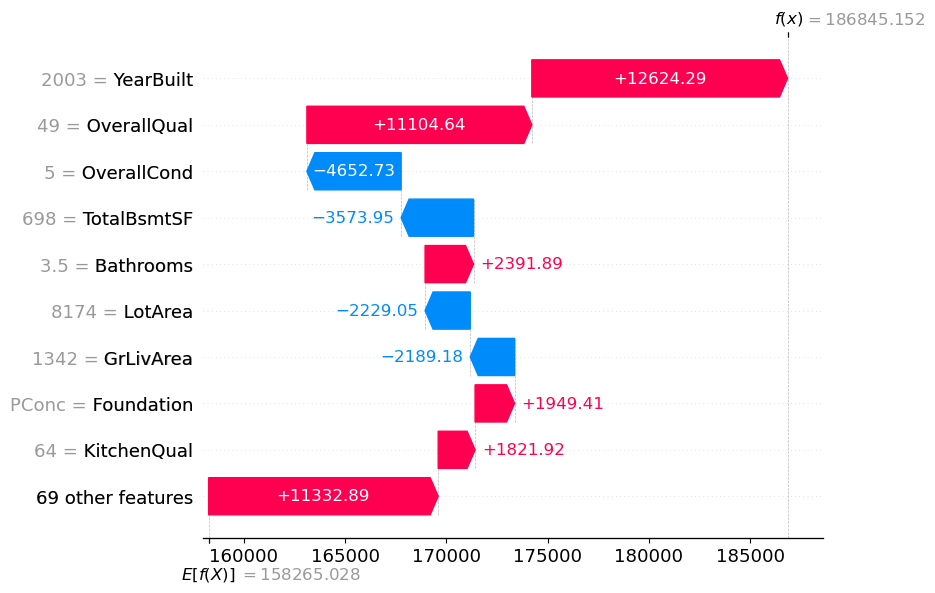

In [175]:
shap.waterfall_plot(exp_lasso[2308])

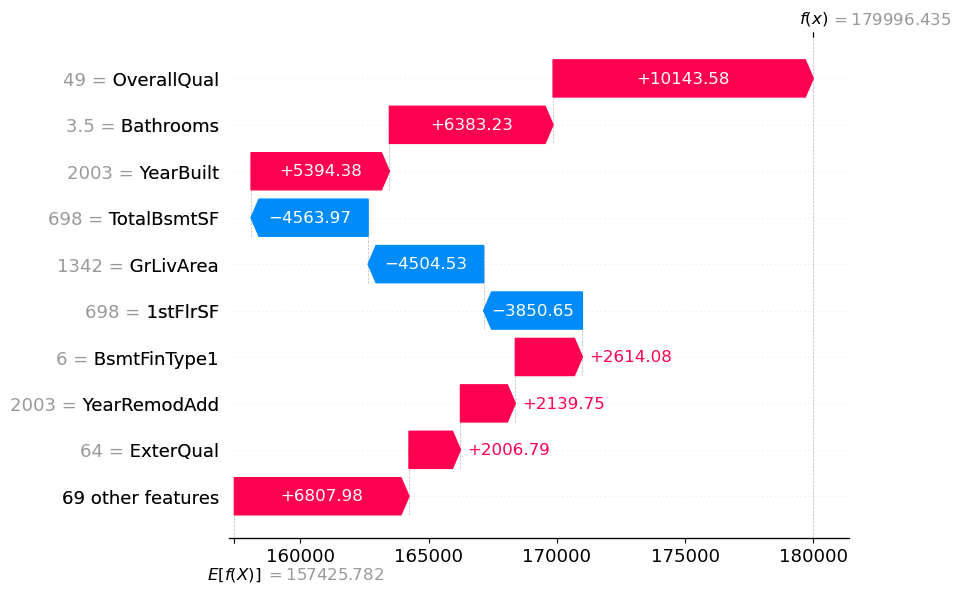

In [174]:
shap.waterfall_plot(exp_xgb_OHE[2308])

In [163]:

trace1 = go.Scatter(
    x=X.Bathrooms,
    y=dollar_shap_df_xgb.Bathrooms,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Bathrooms,
    y= dollar_shap_df_lasso.Bathrooms,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Bathrooms'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

# Other Features

In [320]:
trace1 = go.Scatter(
    x=X.TotalBsmtSF,
    y=dollar_shap_df_xgb.TotalBsmtSF,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.TotalBsmtSF,
    y= dollar_shap_df_lasso.TotalBsmtSF,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Basement SHAP Values',
    xaxis=dict(title='Basement Size (Square Feet)'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [305]:
trace1 = go.Scatter(
    x=(X.BsmtFinSF1 + X.BsmtFinSF2),
    y=(dollar_shap_df_xgb.BsmtFinSF1 + dollar_shap_df_xgb.BsmtFinSF2),
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= (X.BsmtFinSF1 + X.BsmtFinSF2),
    y= (dollar_shap_df_lasso.BsmtFinSF1 + dollar_shap_df_lasso.BsmtFinSF2),
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Finished Basement SHAP Values',
    xaxis=dict(title='Basement size'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [298]:
trace1 = go.Scatter(
    x=X.GarageArea,
    y=dollar_shap_df_xgb.GarageArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageArea,
    y= dollar_shap_df_lasso.GarageArea,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Garage size'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [294]:
trace1 = go.Scatter(
    x=X.BedroomAbvGr,
    y=dollar_shap_df_xgb.BedroomAbvGr,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.BedroomAbvGr,
    y= dollar_shap_df_lasso.BedroomAbvGr,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Bedrooms'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [291]:
trace1 = go.Scatter(
    x=X.KitchenAbvGr,
    y=dollar_shap_df_xgb.KitchenAbvGr,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.KitchenAbvGr,
    y= dollar_shap_df_lasso.KitchenAbvGr,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Kitchens'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [287]:
trace1 = go.Scatter(
    x=X.Fireplaces,
    y=dollar_shap_df_xgb.Fireplaces,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Fireplaces,
    y= dollar_shap_df_lasso.Fireplaces,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Fireplaces'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [284]:
trace1 = go.Scatter(
    x=X.ScreenPorch,
    y=dollar_shap_df_xgb.ScreenPorch,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.ScreenPorch,
    y= dollar_shap_df_lasso.ScreenPorch,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Screen Porch'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

# Exterior

In [313]:
trace1 = go.Scatter(
    x=X.Exterior1st,
    y=dollar_shap_df_xgb.Exterior1st,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Exterior1st,
    y= dollar_shap_df_lasso.Exterior1st,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Exterior SHAP Values',
    xaxis=dict(title='Exterior'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [42]:
import plotly.express as px
from plotly.subplots import make_subplots

# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=2, cols=2, subplot_titles=("log", "Dollars"))

# First scatter plot
scatter1 = px.scatter(
    x=shap_values_df_xgb_log.GrLivArea,
    y=shap_values_df_xgb_log.OverallQual,
    color=np.sqrt(X.OverallQual), 
    title='Living Area SHAP vs. Overall Quality SHAP',
    color_continuous_scale='Turbo'
).update_traces(showlegend=False)

# Second scatter plot
scatter2 = px.scatter(
    x=dollar_shap_df_xgb.GrLivArea,
    y=dollar_shap_df_xgb.OverallQual,
    color=np.sqrt(X.OverallQual), 
    title='Living Area SHAP vs. Overall Quality SHAP',
    color_continuous_scale='Turbo'
).update_traces(showlegend=False)

scatter3 = px.scatter(
    x=shap_values_df_lasso_log.GrLivArea,
    y=shap_values_df_lasso_log.OverallQual,
    color=np.sqrt(X.OverallQual), 
    title='Living Area SHAP vs. Overall Quality SHAP',
    color_continuous_scale='Turbo'
).update_traces(showlegend=False)

# Second scatter plot
scatter4 = px.scatter(
    x=dollar_shap_df_lasso.GrLivArea,
    y=dollar_shap_df_lasso.OverallQual,
    color=np.sqrt(X.OverallQual), 
    title='Living Area SHAP vs. Overall Quality SHAP',
    color_continuous_scale='Turbo'
).update_traces(showlegend=False)

# Add scatter plots to the subplot
for trace in scatter1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in scatter2.data:
    fig.add_trace(trace, row=1, col=2)
    
for trace in scatter3.data:
    fig.add_trace(trace, row=2, col=1)

for trace in scatter4.data:
    fig.add_trace(trace, row=2, col=2)

# Update layout
fig.update_layout(title_text="Comparison of SHAP for XGB Dollars vs. Log Dollars")

# Show the plot
fig.show()
